<a href="https://colab.research.google.com/github/rezaeslahi/ellipsis_eda/blob/main/Wells_EDA_Modeling_Colab_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Wells Dataset - Exploratory Data Analysis and Modeling (Google Colab Compatible)

📁 Step 1: Upload Required Data

This cell allows you to upload the two required CSV files:
- env_csv-Wells-d7220_2025-03-18.csv
- enhanced_feature_summary.csv

In [ ]:

from google.colab import files
uploaded = files.upload()

Saving enhanced_feature_summary.csv to enhanced_feature_summary.csv
Saving env_csv-Wells-d7220_2025-03-18.csv to env_csv-Wells-d7220_2025-03-18.csv


📊 Step 2: Import Required Libraries

Import core libraries for data handling and visualization
Set plot styles

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")
plt.rcParams.update({'figure.max_open_warning': 0})

📥 Step 3: Load the Datasets

Load both the wells dataset and the feature summary for interpretation

In [ ]:

wells_df = pd.read_csv("env_csv-Wells-d7220_2025-03-18.csv")
feature_summary_df = pd.read_csv("enhanced_feature_summary.csv")

<ipython-input-3-3cacb3006fe6>:1: DtypeWarning: Columns (64,104) have mixed types. Specify dtype option on import or set low_memory=False.
  wells_df = pd.read_csv("env_csv-Wells-d7220_2025-03-18.csv")


🔍 Step 4: Missing Values Analysis

Calculate and display the percentage of missing values per column

In [ ]:

# 📊 Analyze missing data by percentage

# Calculate % of missing values per column
missing_ratio = wells_df.isnull().mean() * 100

# 🎯 Define missingness categories
fully_missing = (missing_ratio == 100).sum()
missing_75_100 = ((missing_ratio > 75) & (missing_ratio < 100)).sum()
missing_50_75 = ((missing_ratio > 50) & (missing_ratio <= 75)).sum()

# 📝 Display results
print("🔍 Missing Data Summary:")
print(f"✅ Features with 100% missing values: {fully_missing}")
print(f"⚠️ Features with >75% and <100% missing: {missing_75_100}")
print(f"🟡 Features with >50% and <=75% missing: {missing_50_75}")


🔍 Missing Data Summary:
✅ Features with 100% missing values: 43
⚠️ Features with >75% and <100% missing: 17
🟡 Features with >50% and <=75% missing: 37


📈 Step 5: Summary Statistics for Numeric Columns

Generate descriptive statistics to understand the distribution of features

In [ ]:

summary_stats = wells_df.describe().T
summary_stats.head(20)

,count,mean,std,min,25%,50%,75%,max
Unformatted_API_UWI,10714.0,3.002116e+09,4.951807e+05,3.001538e+09,3.001548e+09,3.002543e+09,3.002548e+09,3.002593e+09
Unformatted_API_UWI_12,10714.0,3.002116e+11,4.951807e+07,3.001538e+11,3.001548e+11,3.002543e+11,3.002548e+11,3.002593e+11
Unformatted_API_UWI_14,10714.0,3.002116e+13,4.951807e+09,3.001538e+13,3.001548e+13,3.002543e+13,3.002548e+13,3.002593e+13
WellID,10714.0,8.403000e+14,7.037235e+06,8.403000e+14,8.403000e+14,8.403000e+14,8.403000e+14,8.403000e+14
CompletionID,10714.0,8.403010e+14,1.857274e+06,8.403010e+14,8.403010e+14,8.403010e+14,8.403010e+14,8.403010e+14
ENVWellGrouping,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CompletionNumber,10533.0,1.001899e+00,4.353583e-02,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00
Lease,10714.0,3.052751e+05,7.529181e+04,3.522000e+03,3.180842e+05,3.260530e+05,3.326308e+05,3.370580e+05
ENVSpacingAssumption,9005.0,1.148308e+03,4.499913e+02,1.000000e+00,8.280000e+02,1.157000e+03,1.379000e+03,2.639000e+03
OnConfidential,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


🧾 Step 6: Data Types Distribution

Count how many columns are of each data type

In [ ]:

data_types = wells_df.dtypes.value_counts()
data_types

,count
float64,405
object,100
int64,14


📉 Step 7: Plot Top 20 Features with Most Missing Values

Visualize the most incomplete features for decision making

🧊 Step 8: Correlation Heatmap (Top 20 High Variance Features)

Compute and visualize correlation matrix among top varying numerical features

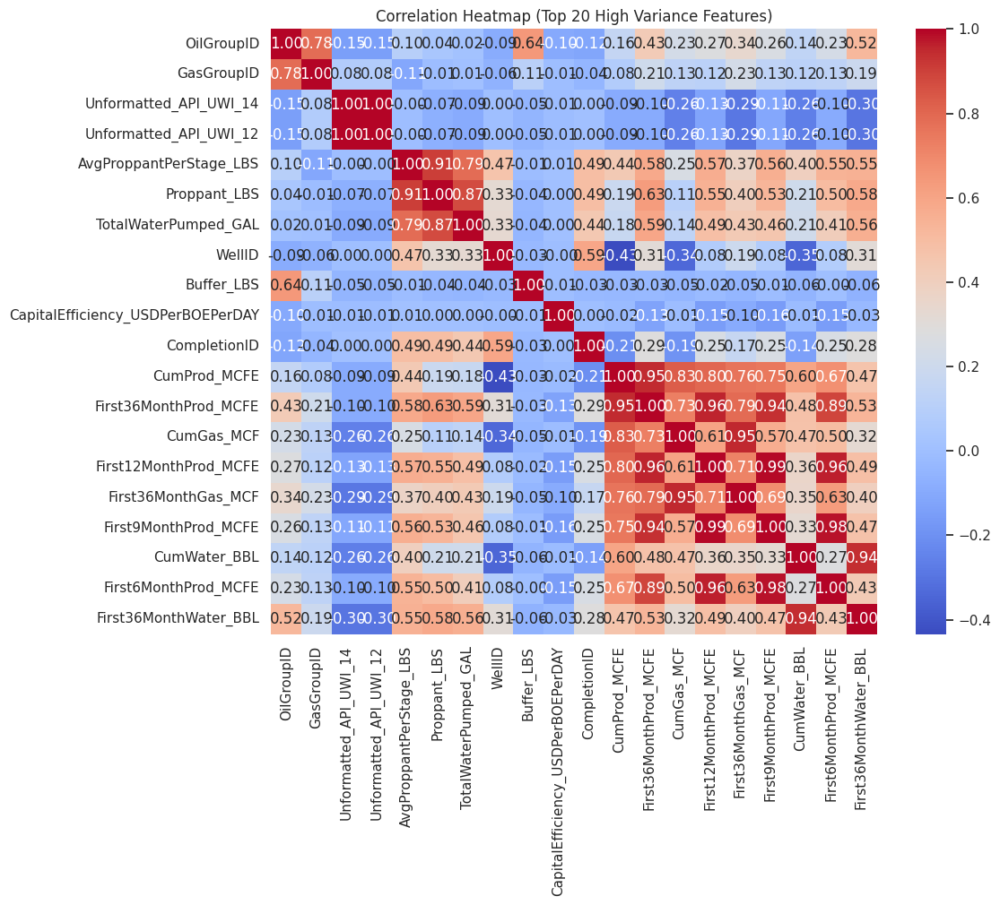

In [ ]:

numeric_cols = wells_df.select_dtypes(include=['float64', 'int64'])
top_var_cols = numeric_cols.var().sort_values(ascending=False).head(20).index
corr_matrix = wells_df[top_var_cols].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation Heatmap (Top 20 High Variance Features)")
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:292

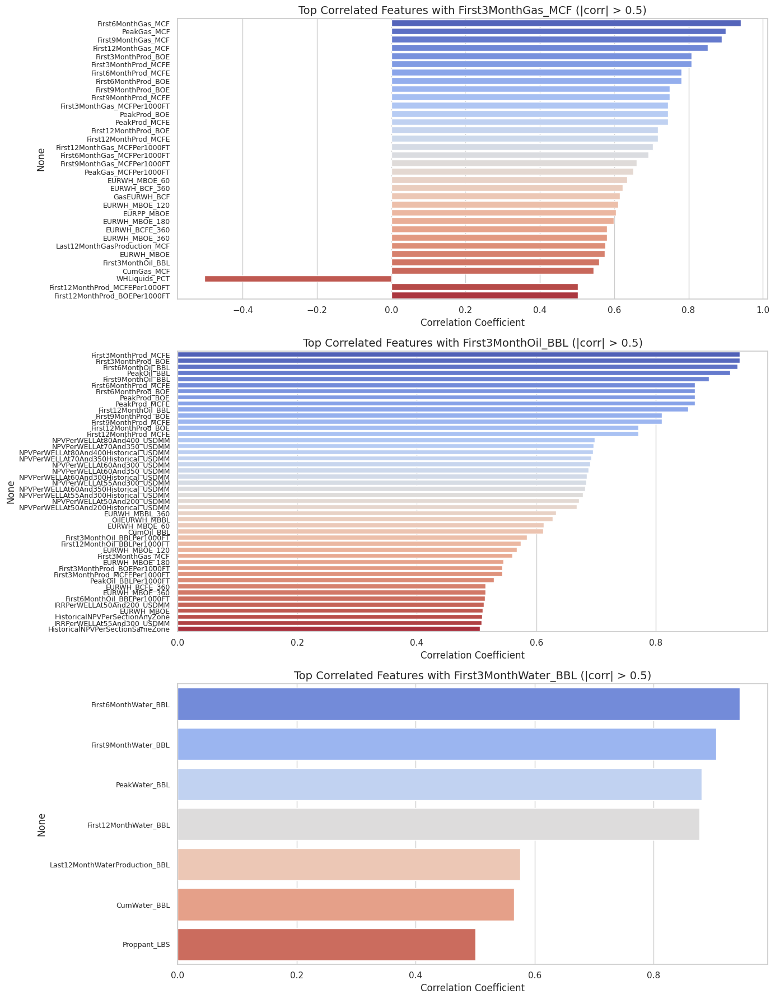

<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')


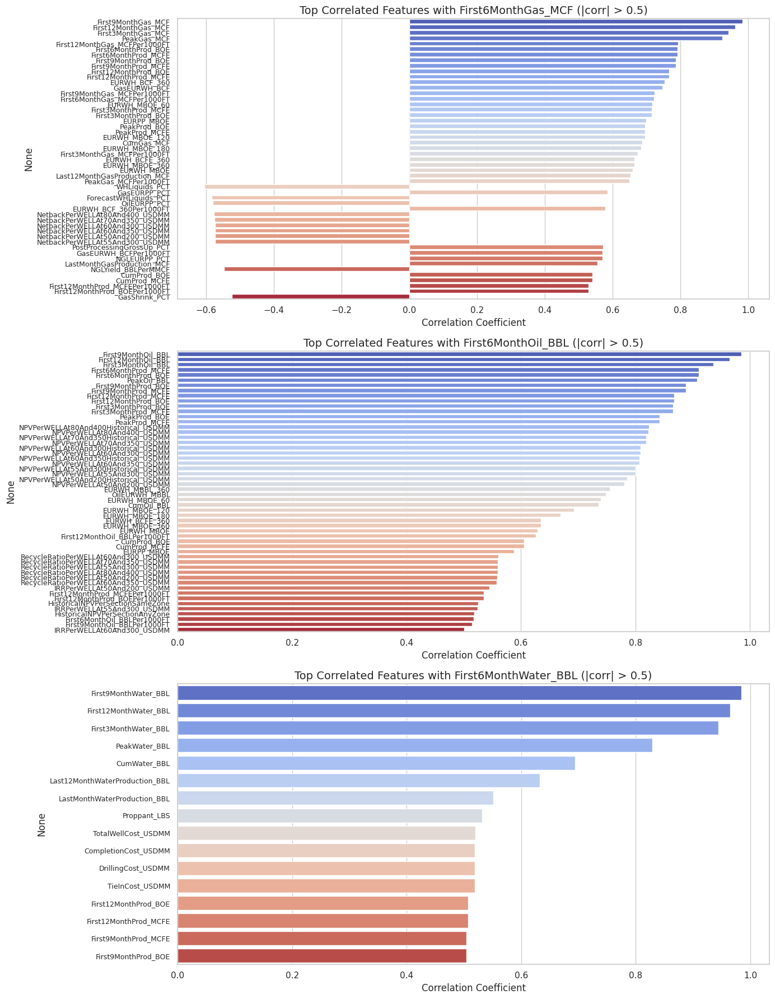

<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')


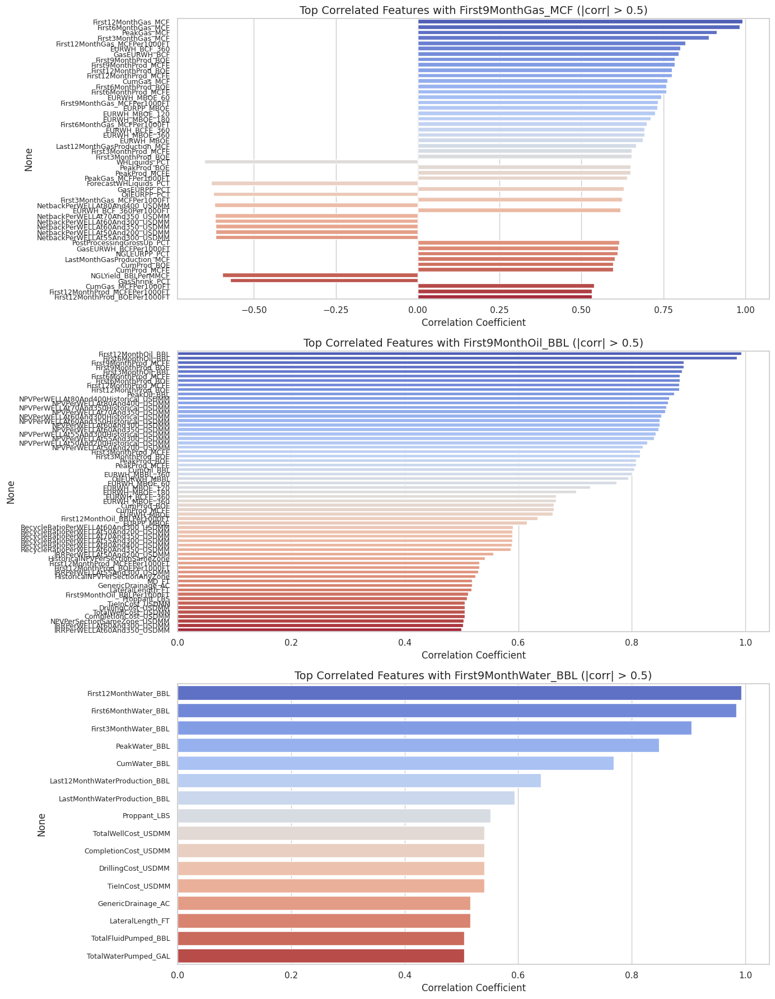

<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')


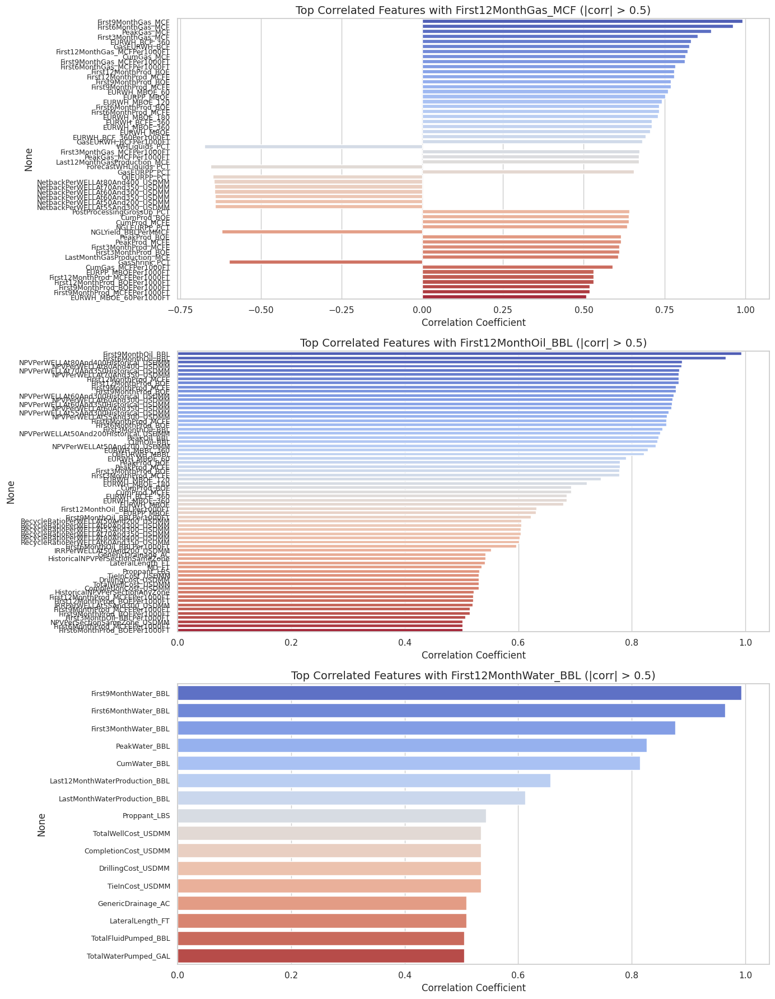

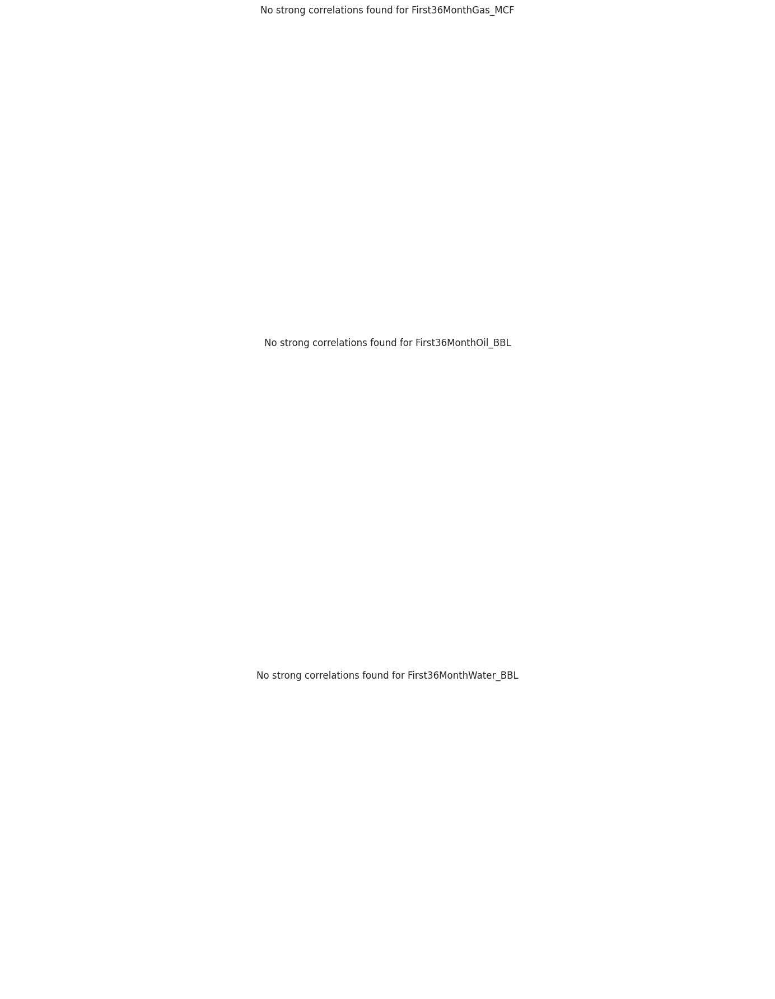

<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')


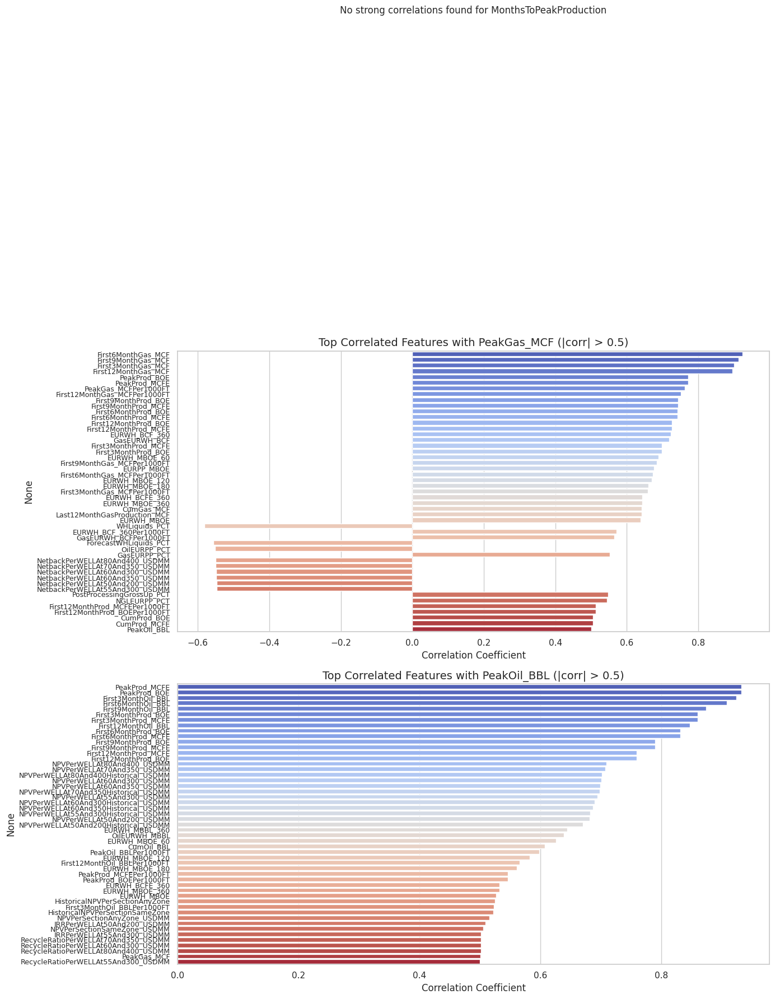

<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')


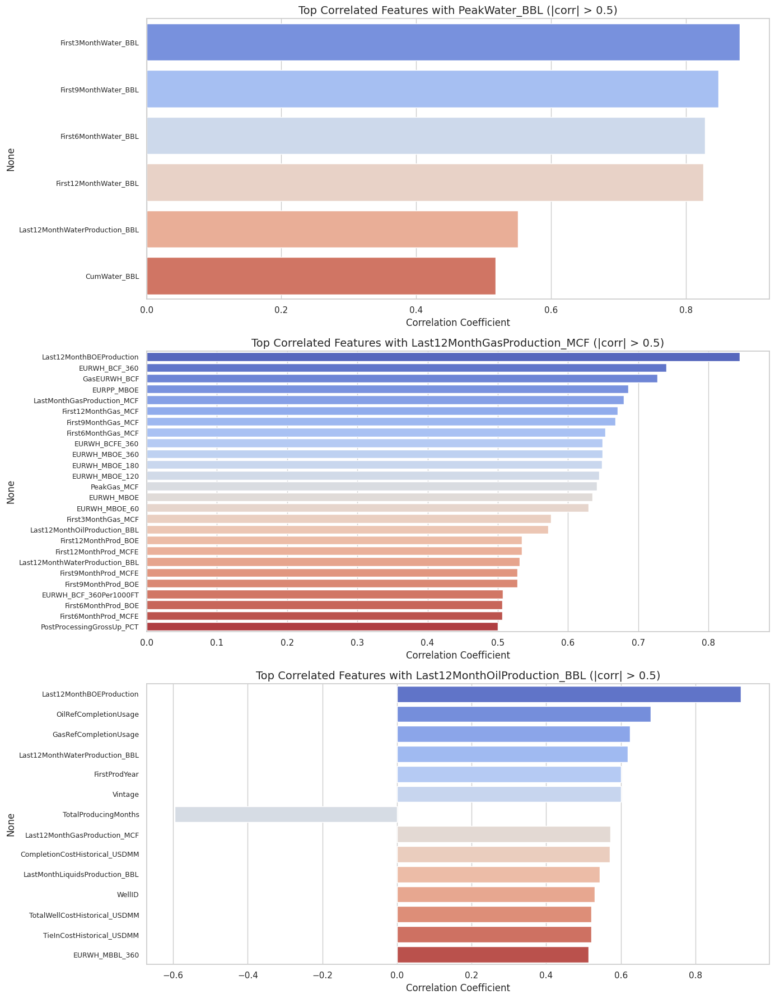

<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
<ipython-input-9-ad2e5d22a95f>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')


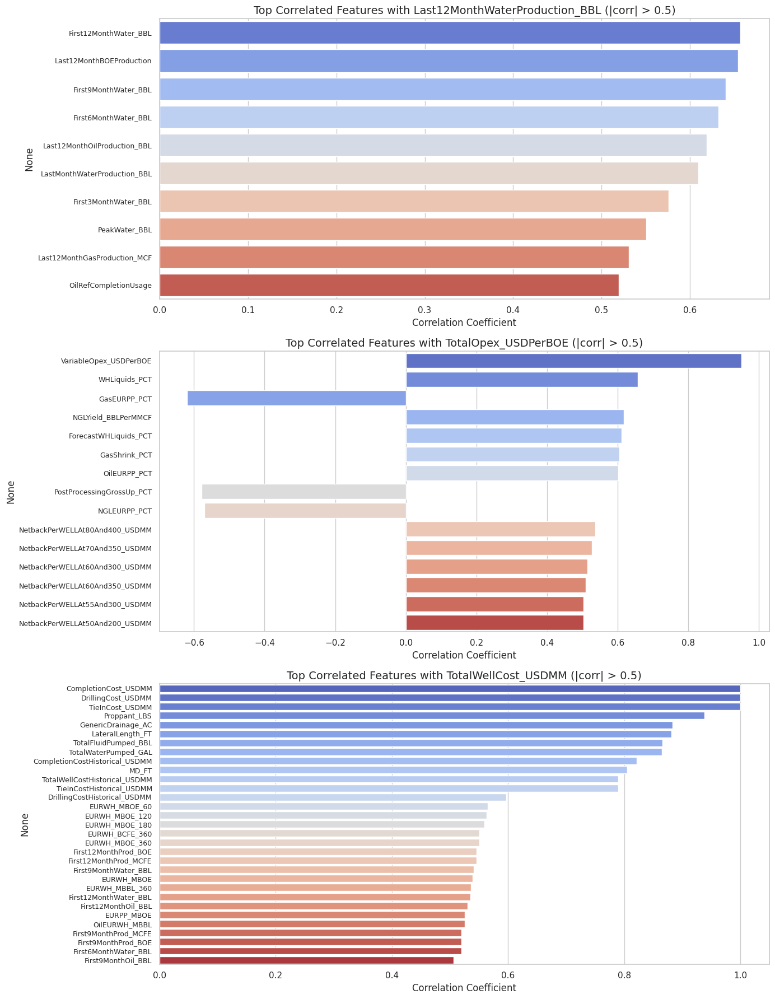

In [ ]:
# 🧹 Drop columns with more than 40% missing values
threshold = 0.4
df_reduced = wells_df.dropna(axis=1, thresh=int((1 - threshold) * len(wells_df)))

# 🎯 Select numeric features only
df_numeric = df_reduced.select_dtypes(include=["float64", "int64"])

# 🧾 Define main parameters
main_parameters = [
    "First3MonthGas_MCF", "First3MonthOil_BBL", "First3MonthWater_BBL",
    "First6MonthGas_MCF", "First6MonthOil_BBL", "First6MonthWater_BBL",
    "First9MonthGas_MCF", "First9MonthOil_BBL", "First9MonthWater_BBL",
    "First12MonthGas_MCF", "First12MonthOil_BBL", "First12MonthWater_BBL",
    "First36MonthGas_MCF", "First36MonthOil_BBL", "First36MonthWater_BBL",
    "MonthsToPeakProduction", "PeakGas_MCF", "PeakOil_BBL", "PeakWater_BBL",
    "Last12MonthGasProduction_MCF", "Last12MonthOilProduction_BBL", "Last12MonthWaterProduction_BBL",
    "TotalOpex_USDPerBOE", "TotalWellCost_USDMM"
]

# 📊 Compute correlation of each main parameter with all others
correlation_results = {}
for param in main_parameters:
    if param in df_numeric.columns:
        corr_series = df_numeric.corrwith(df_numeric[param]).drop(labels=[param])
        correlation_results[param] = corr_series[corr_series.abs() > 0.5].sort_values(key=abs, ascending=False)

# 📈 Visualize top correlated features (|correlation| > 0.5)
sns.set(style="whitegrid")
chunks = [main_parameters[i:i + 3] for i in range(0, len(main_parameters), 3)]

for group in chunks:
    fig, axes = plt.subplots(nrows=len(group), ncols=1, figsize=(14, 6 * len(group)))
    if len(group) == 1:
        axes = [axes]

    for i, param in enumerate(group):
        series = correlation_results.get(param)
        ax = axes[i]
        if series is not None and not series.empty:
            sns.barplot(x=series.values, y=series.index, ax=ax, palette='coolwarm')
            ax.set_title(f"Top Correlated Features with {param} (|corr| > 0.5)", fontsize=14)
            ax.set_xlabel("Correlation Coefficient", fontsize=12)
            ax.tick_params(axis='y', labelsize=10)
            for label in ax.get_yticklabels():
                label.set_rotation(0)         # Keep horizontal
                label.set_ha('right')         # Align right for readability
                label.set_fontsize(9)         # Reduce font size
        else:
            ax.set_title(f"No strong correlations found for {param}")
            ax.set_axis_off()

    plt.tight_layout()
    plt.show()

In [ ]:
# 🛠️ Create Efficiency Variables using wells_df
wells_df['Efficiency_Oil3M_perCost'] = wells_df['First3MonthOil_BBL'] / wells_df['TotalWellCost_USDMM']
wells_df['Efficiency_Oil6M_perCost'] = wells_df['First6MonthOil_BBL'] / wells_df['TotalWellCost_USDMM']
wells_df['Efficiency_Oil12M_perCost'] = wells_df['First12MonthOil_BBL'] / wells_df['TotalWellCost_USDMM']

# Handle infinities and missing values
efficiency_cols = ['Efficiency_Oil3M_perCost', 'Efficiency_Oil6M_perCost', 'Efficiency_Oil12M_perCost']
wells_df[efficiency_cols] = wells_df[efficiency_cols].replace([np.inf, -np.inf], np.nan)


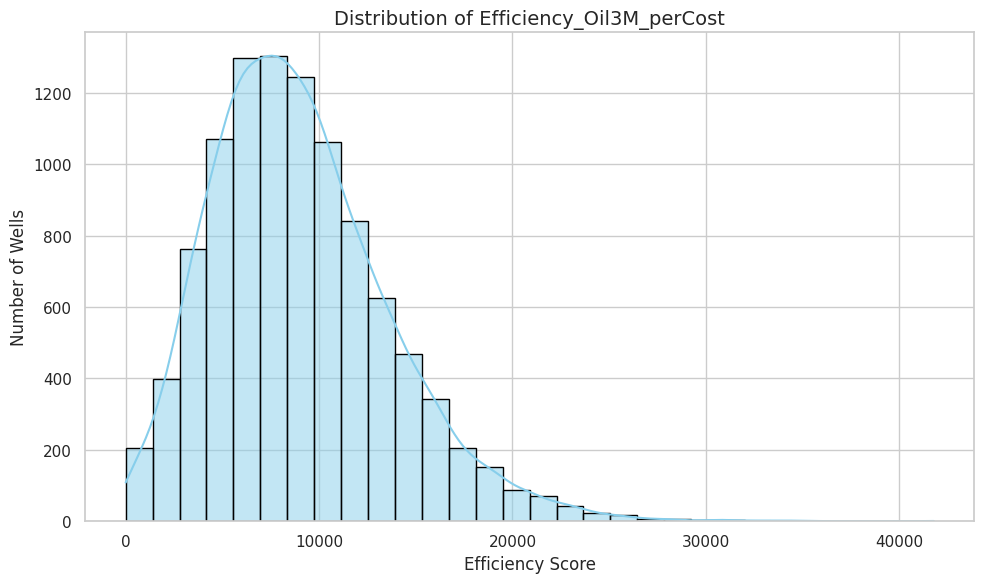

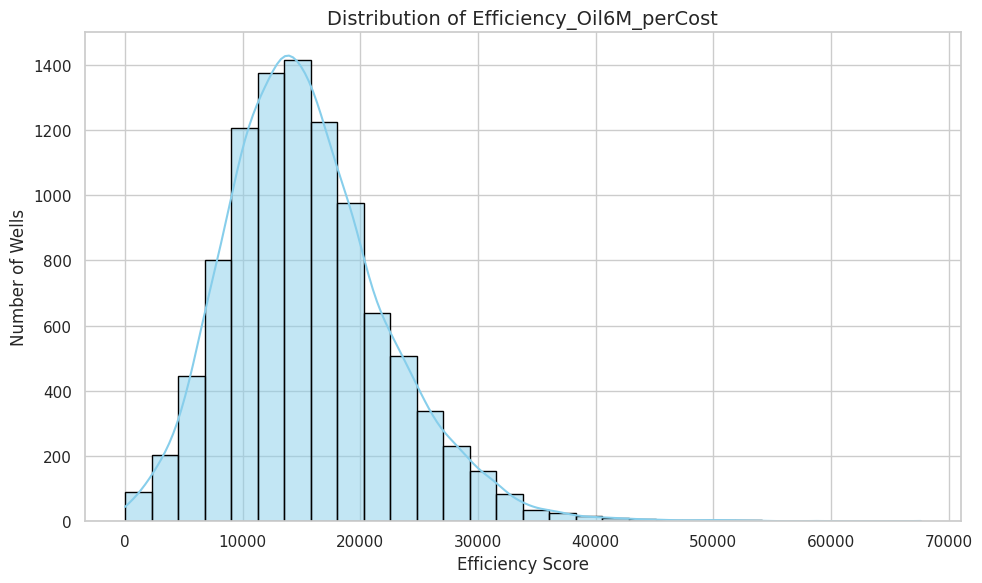

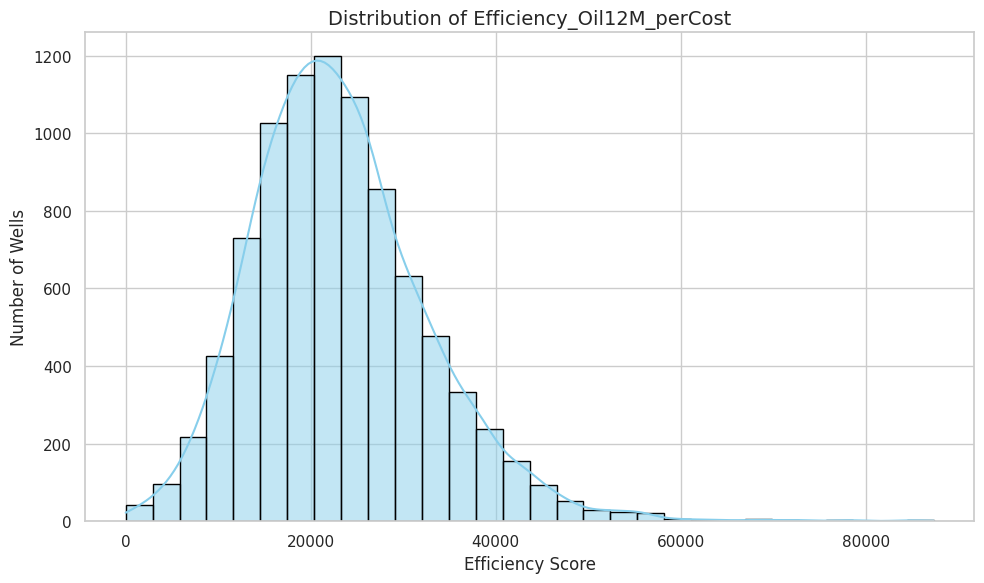

In [ ]:


def plot_efficiency_distribution(df, efficiency_col, bins=30):
    """
    Plot the KDE + Histogram (discretized) for an efficiency variable.

    Parameters:
        df (pd.DataFrame): Input data with efficiency column
        efficiency_col (str): Column name of the efficiency variable
        bins (int): Number of bins for the histogram
    """
    data = df[efficiency_col].dropna()

    plt.figure(figsize=(10, 6))
    sns.histplot(data, bins=bins, kde=True, color='skyblue', edgecolor='black')

    plt.title(f"Distribution of {efficiency_col}", fontsize=14)
    plt.xlabel("Efficiency Score", fontsize=12)
    plt.ylabel("Number of Wells", fontsize=12)
    plt.tight_layout()
    plt.show()

# 📊 Plot distributions for each efficiency variable
plot_efficiency_distribution(wells_df, 'Efficiency_Oil3M_perCost')
plot_efficiency_distribution(wells_df, 'Efficiency_Oil6M_perCost')
plot_efficiency_distribution(wells_df, 'Efficiency_Oil12M_perCost')


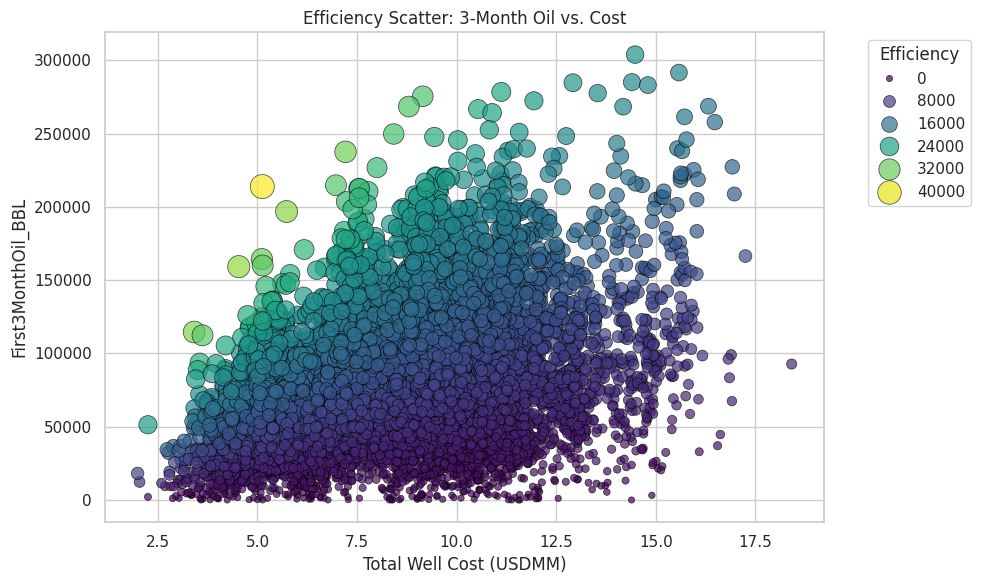

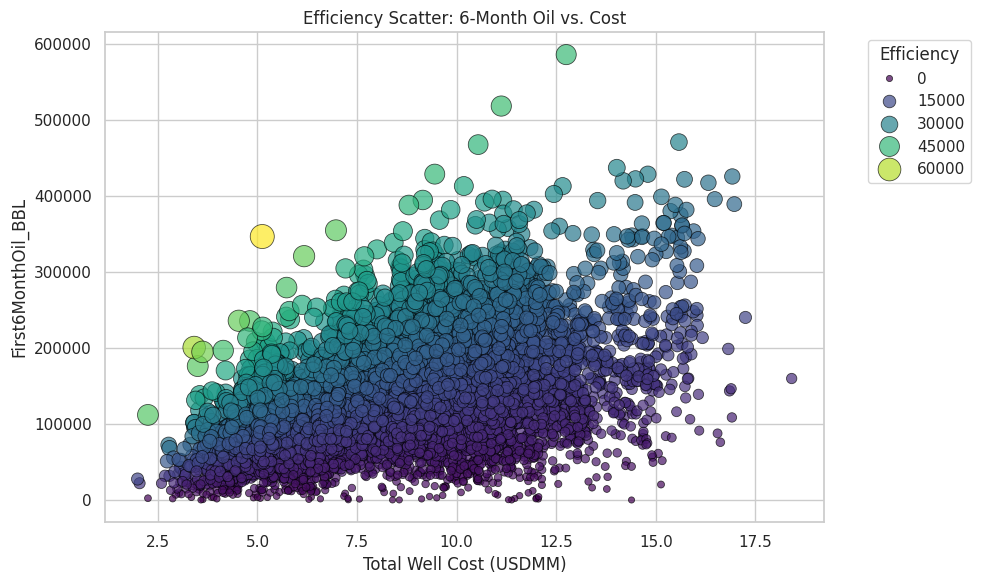

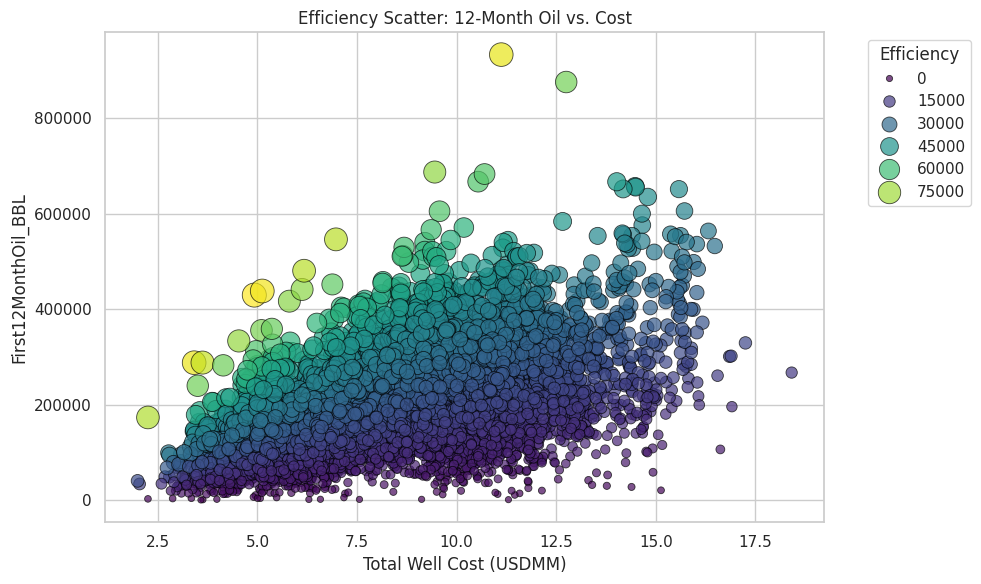

In [ ]:
def scatter_efficiency(df, oil_col, cost_col, efficiency_col, title):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        x=cost_col,
        y=oil_col,
        size=efficiency_col,
        hue=efficiency_col,
        palette='viridis',
        sizes=(20, 300),
        data=df,
        alpha=0.7,
        edgecolor='black'
    )
    plt.title(title)
    plt.xlabel("Total Well Cost (USDMM)")
    plt.ylabel(f"{oil_col}")
    plt.legend(title="Efficiency", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Example for 3-month oil
scatter_efficiency(
    wells_df,
    oil_col='First3MonthOil_BBL',
    cost_col='TotalWellCost_USDMM',
    efficiency_col='Efficiency_Oil3M_perCost',
    title='Efficiency Scatter: 3-Month Oil vs. Cost'
)

scatter_efficiency(
    wells_df,
    oil_col='First6MonthOil_BBL',
    cost_col='TotalWellCost_USDMM',
    efficiency_col='Efficiency_Oil6M_perCost',
    title='Efficiency Scatter: 6-Month Oil vs. Cost'
)

scatter_efficiency(
    wells_df,
    oil_col='First12MonthOil_BBL',
    cost_col='TotalWellCost_USDMM',
    efficiency_col='Efficiency_Oil12M_perCost',
    title='Efficiency Scatter: 12-Month Oil vs. Cost'
)


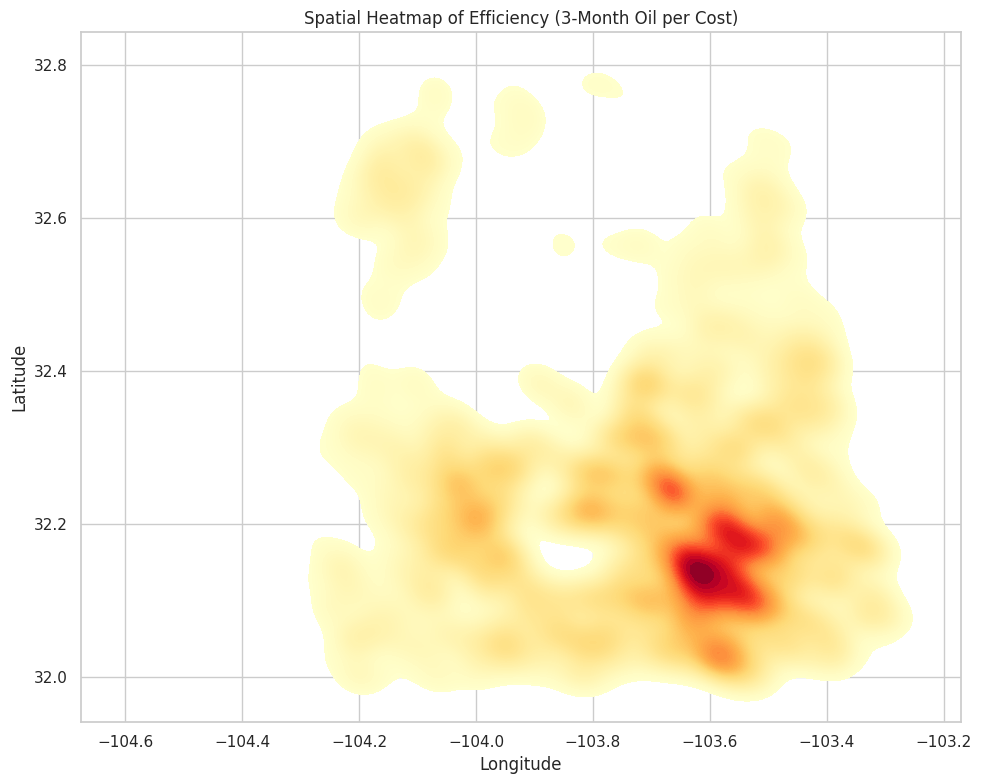

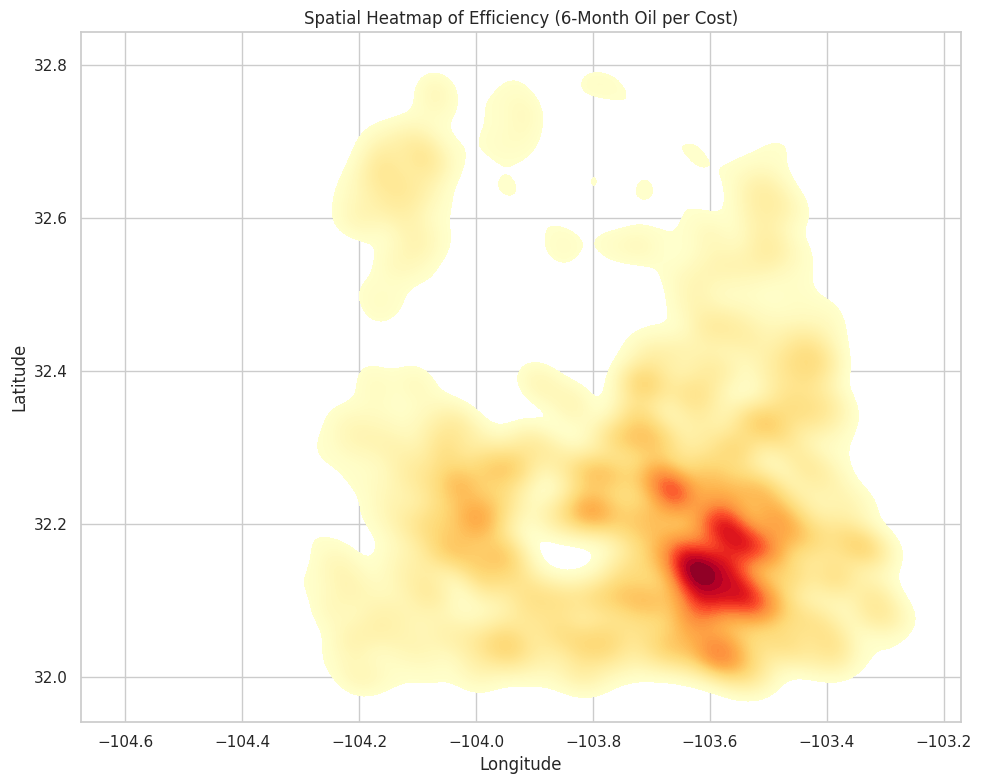

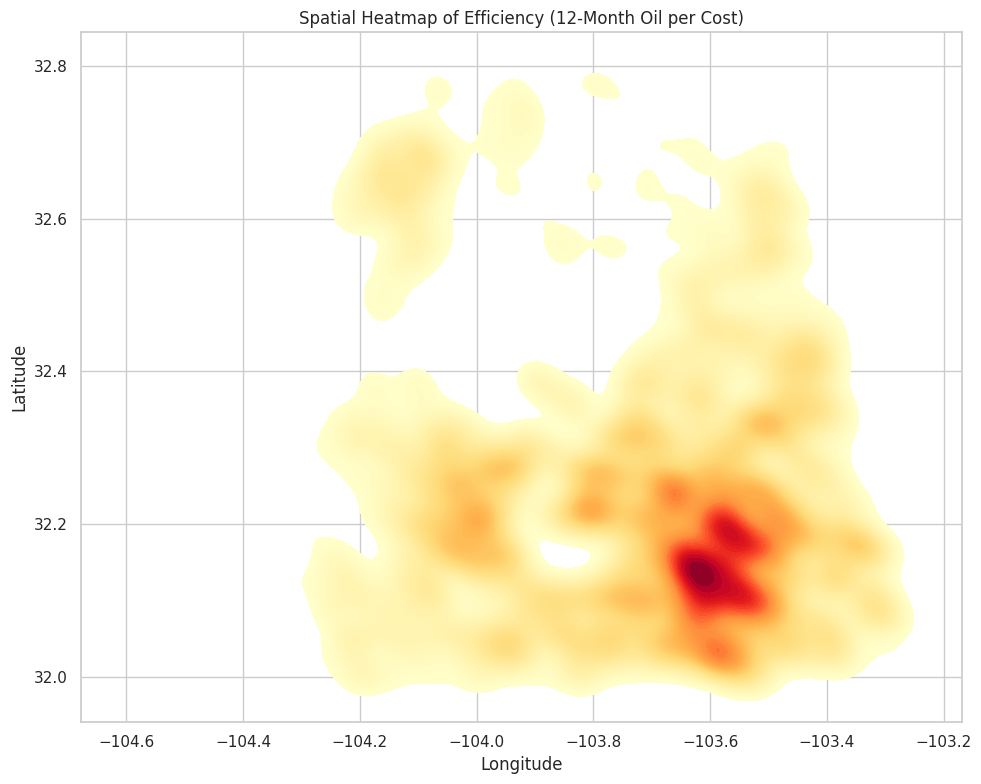

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_efficiency_heatmap(df, efficiency_col, title):
    """
    Creates a spatial KDE heatmap for a given efficiency variable using well locations.
    """
    # Drop missing values in location or efficiency
    data = df[['Latitude', 'Longitude', efficiency_col]].dropna()

    plt.figure(figsize=(10, 8))
    sns.kdeplot(
        x=data['Longitude'],
        y=data['Latitude'],
        weights=data[efficiency_col],
        cmap='YlOrRd',
        fill=True,
        bw_adjust=0.5,
        thresh=0.05,
        levels=100
    )
    plt.title(title)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.tight_layout()
    plt.show()

# 🌍 Generate spatial heatmaps for all efficiency metrics
plot_efficiency_heatmap(wells_df, 'Efficiency_Oil3M_perCost', 'Spatial Heatmap of Efficiency (3-Month Oil per Cost)')
plot_efficiency_heatmap(wells_df, 'Efficiency_Oil6M_perCost', 'Spatial Heatmap of Efficiency (6-Month Oil per Cost)')
plot_efficiency_heatmap(wells_df, 'Efficiency_Oil12M_perCost', 'Spatial Heatmap of Efficiency (12-Month Oil per Cost)')


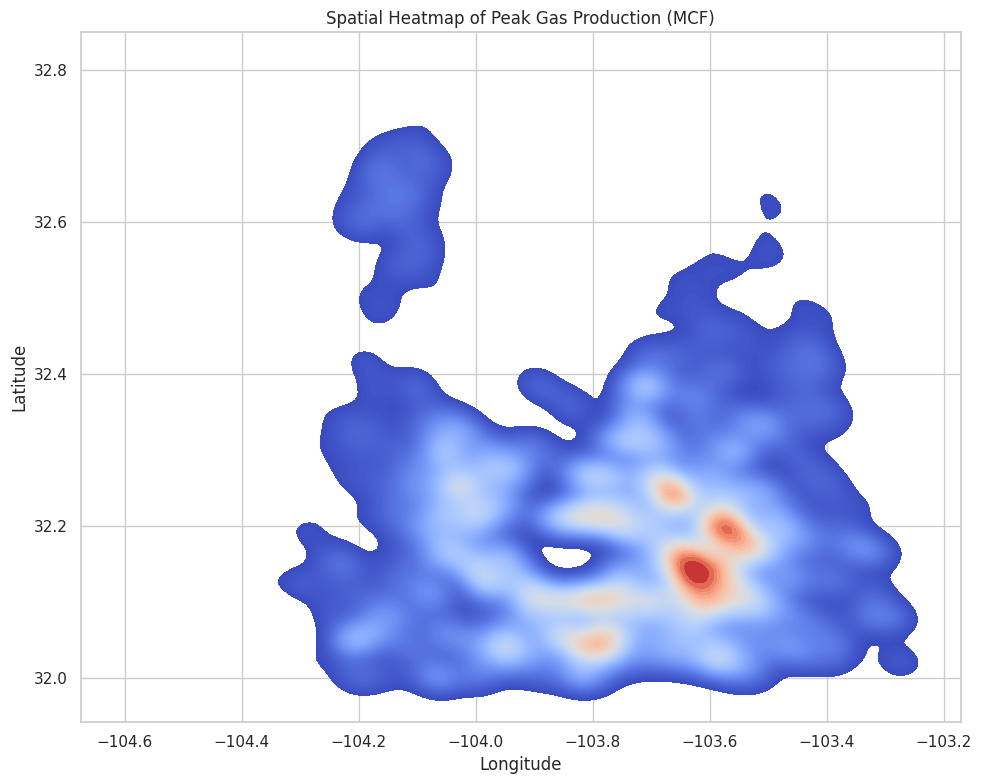

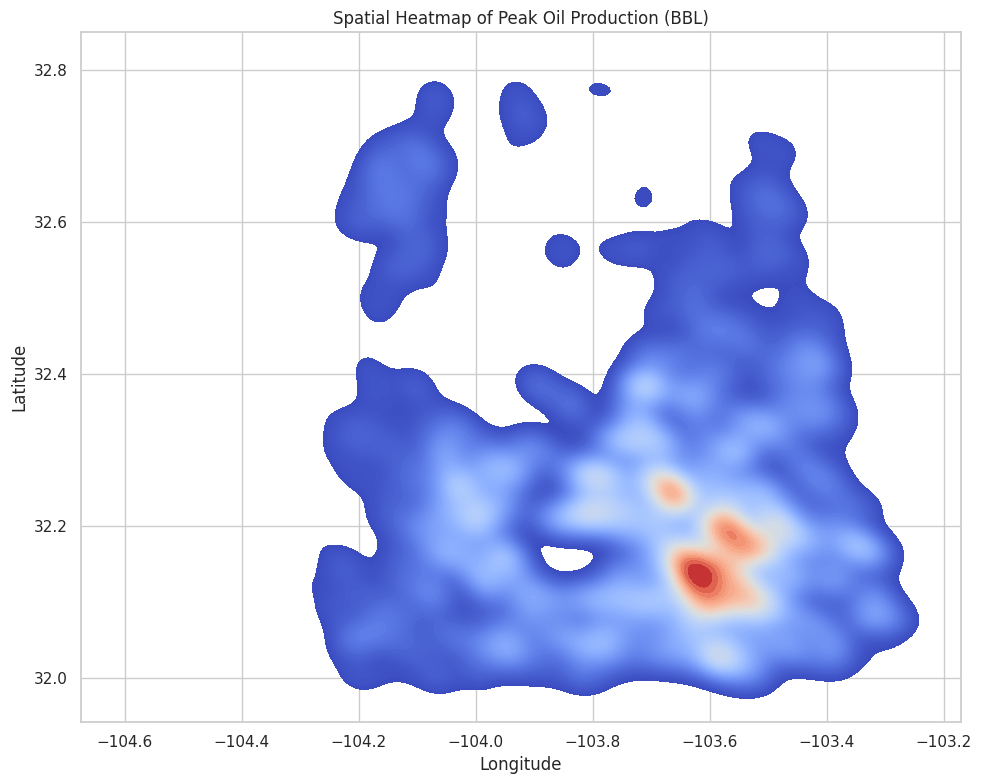

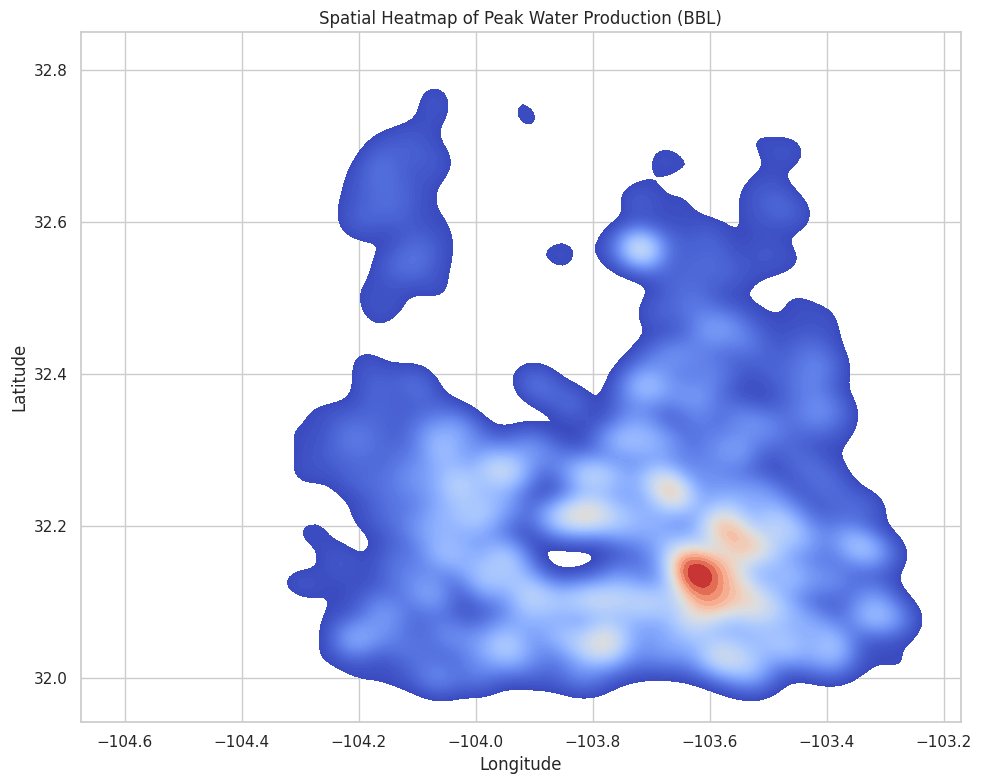

In [ ]:
def plot_peak_heatmap(df, production_col, title):
    """
    Creates a spatial KDE heatmap for a given peak production variable.
    """
    # Drop rows with missing values in coordinates or target column
    data = df[['Latitude', 'Longitude', production_col]].dropna()

    plt.figure(figsize=(10, 8))
    sns.kdeplot(
        x=data['Longitude'],
        y=data['Latitude'],
        weights=data[production_col],
        cmap='coolwarm',
        fill=True,
        bw_adjust=0.5,
        thresh=0.05,
        levels=100
    )
    plt.title(title)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.tight_layout()
    plt.show()

# 🌍 Spatial heatmaps for peak production
plot_peak_heatmap(wells_df, 'PeakGas_MCF', 'Spatial Heatmap of Peak Gas Production (MCF)')
plot_peak_heatmap(wells_df, 'PeakOil_BBL', 'Spatial Heatmap of Peak Oil Production (BBL)')
plot_peak_heatmap(wells_df, 'PeakWater_BBL', 'Spatial Heatmap of Peak Water Production (BBL)')


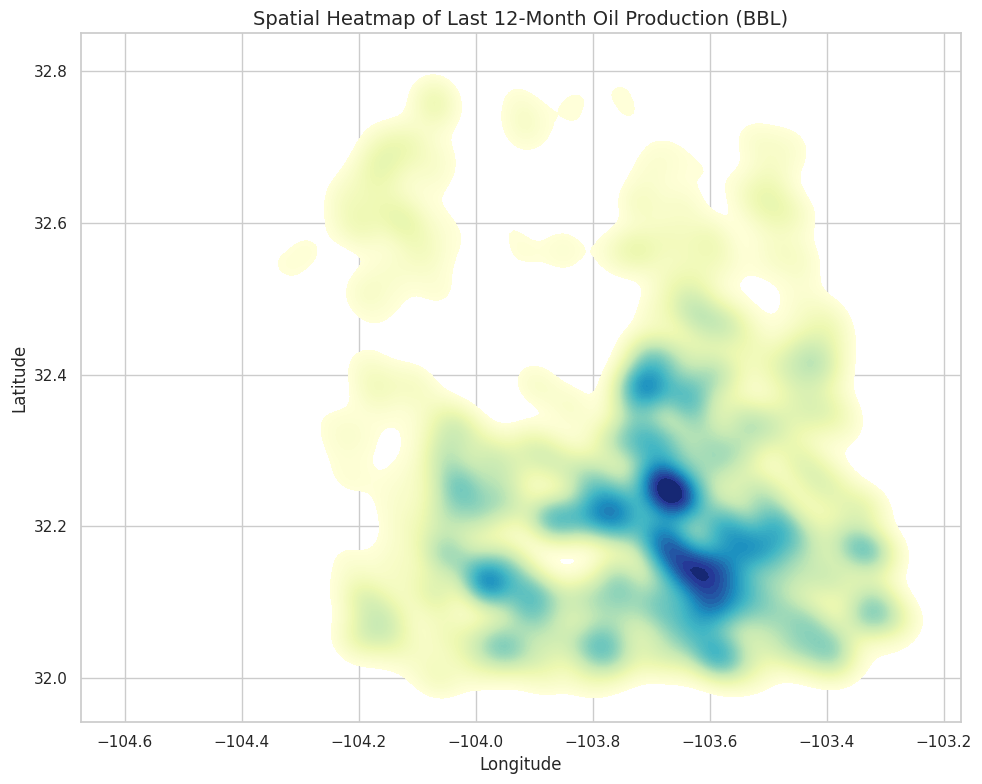

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_kde_heatmap(df, value_col, title):
    """
    Plot KDE heatmap using seaborn for a given production column.
    """
    # Drop missing values for coordinates and the target variable
    data = df[['Latitude', 'Longitude', value_col]].dropna()

    plt.figure(figsize=(10, 8))
    sns.kdeplot(
        x=data['Longitude'],
        y=data['Latitude'],
        weights=data[value_col],
        cmap='YlGnBu',
        fill=True,
        bw_adjust=0.5,
        levels=100,
        thresh=0.05
    )
    plt.title(title, fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.tight_layout()
    plt.show()

# 🛢️ Heatmap for Last 12 Month Oil Production
plot_kde_heatmap(
    wells_df,
    value_col='Last12MonthOilProduction_BBL',
    title='Spatial Heatmap of Last 12-Month Oil Production (BBL)'
)


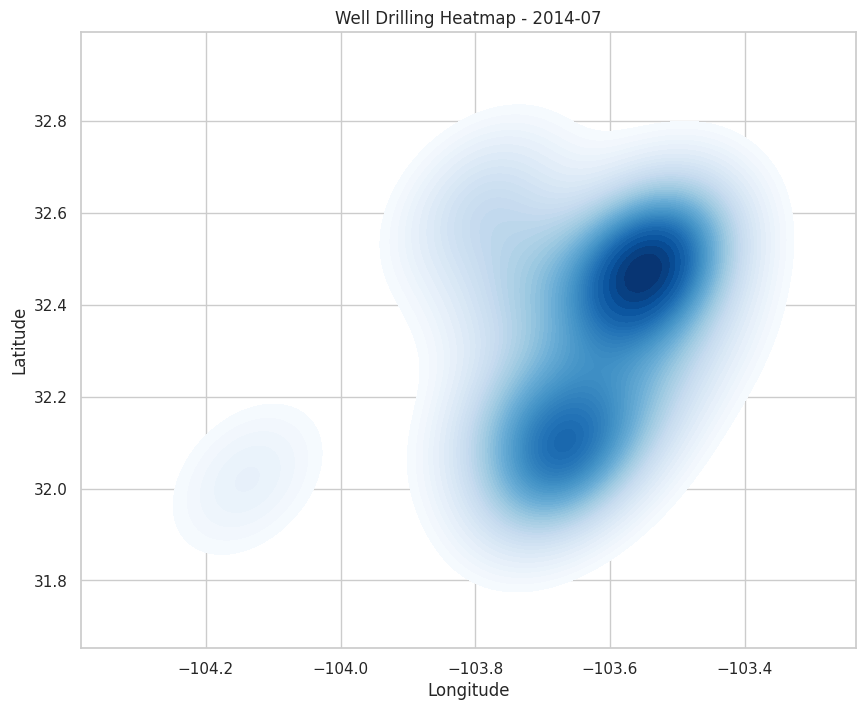

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# 🧪 Safe copy for animation work
wells_map_df = wells_df.copy()

# 📅 Clean and prep SpudDate column
wells_map_df['SpudDate'] = pd.to_datetime(wells_map_df['SpudDate'], errors='coerce')
wells_map_df = wells_map_df.dropna(subset=['SpudDate', 'Latitude', 'Longitude'])
wells_map_df['YearMonth'] = wells_map_df['SpudDate'].dt.to_period('M').astype(str)

# 🧼 Only keep months with at least 5 wells
valid_months = wells_map_df['YearMonth'].value_counts()
valid_months = valid_months[valid_months >= 5].index.sort_values()

# 🎬 Set up figure
fig, ax = plt.subplots(figsize=(10, 8))

def draw_frame(month):
    ax.clear()
    month_data = wells_map_df[wells_map_df['YearMonth'] == month]

    sns.kdeplot(
        x=month_data['Longitude'],
        y=month_data['Latitude'],
        fill=True,
        cmap='Blues',
        thresh=0.05,
        levels=50,
        ax=ax
    )

    ax.set_title(f"Well Drilling Heatmap - {month}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.grid(True)

# 🎥 Build animation with filtered frames only
anim = FuncAnimation(fig, draw_frame, frames=valid_months, repeat=False)

# 💡 Display inline in notebook
HTML(anim.to_jshtml())



In [ ]:
# 🎥 Export animation to .mp4

# Ensure you have ffmpeg installed in Colab (should be by default)
!apt-get -y install ffmpeg  # Uncomment if running locally and need ffmpeg

# Export to file
mp4_path = "well_drilling_heatmap_animation.mp4"
anim.save(mp4_path, writer='ffmpeg', fps=3)

print(f"✅ Animation saved to {mp4_path}")

from google.colab import files
files.download(mp4_path)


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.
✅ Animation saved to well_drilling_heatmap_animation.mp4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

🧾 Step 9: Categorical Columns - Value Counts

Review the most frequent values in categorical columns

In [ ]:

cat_cols = wells_df.select_dtypes(include=['object']).columns
for col in cat_cols[:5]:
    print(f"\nValue counts for: {col}")
    print(wells_df[col].value_counts(dropna=False).head(10))


Value counts for: API_UWI
API_UWI
30-015-45079    3
30-015-44620    3
30-015-49979    3
30-025-46811    3
30-025-47546    3
30-015-45087    3
30-015-46202    3
30-015-49620    3
30-015-45525    3
30-025-48505    2
Name: count, dtype: int64

Value counts for: API_UWI_12
API_UWI_12
30-025-45633-00    2
30-025-47514-00    2
30-025-46389-00    2
30-025-42710-00    2
30-025-43563-00    2
30-025-45212-00    2
30-025-45211-00    2
30-025-42709-00    2
30-025-41518-00    2
30-025-42652-00    2
Name: count, dtype: int64

Value counts for: API_UWI_14
API_UWI_14
30-025-53756-00-00    1
30-015-39436-00-00    1
30-015-41142-00-00    1
30-015-41148-00-00    1
30-015-41194-00-00    1
30-015-41359-00-00    1
30-015-41740-00-00    1
30-015-41803-00-00    1
30-015-41981-00-00    1
30-015-42113-00-00    1
Name: count, dtype: int64

Value counts for: WellPadID
WellPadID
30-025-45591    48
30-015-44453    27
30-025-46971    27
30-015-43858    21
30-025-46622    19
30-025-42875    19
30-015-47224    18
30-

⚠️ Step 10: Outlier Detection

### 📊 Outlier Detection: Key Concepts

#### **1. Q1 (First Quartile)**
- The 25th percentile of your data.
- 25% of the values are less than or equal to Q1.
- Represents the “lower hinge” of the data.

#### **2. Q3 (Third Quartile)**
- The 75th percentile of your data.
- 75% of the values are less than or equal to Q3.
- Represents the “upper hinge” of the data.

#### **3. IQR (Interquartile Range)**
- IQR = Q3 − Q1
- Measures the spread of the **middle 50%** of your dataset.
- A robust metric that’s not heavily influenced by extreme values.

#### **4. Lower Bound & Upper Bound (Outlier Cutoffs)**
- These are thresholds to identify outliers:
  - **Lower Bound** = Q1 − 1.5 × IQR
  - **Upper Bound** = Q3 + 1.5 × IQR
- Any value:
  - **Below Lower Bound** is a **low-end outlier**
  - **Above Upper Bound** is a **high-end outlier**

---

#### 📌 **Example**
If:
- Q1 = 100  
- Q3 = 300  
Then:
- IQR = 200  
- Lower Bound = 100 − 1.5 × 200 = −200  
- Upper Bound = 300 + 1.5 × 200 = 600  

➡️ Any value **< −200** or **> 600** is considered an **outlier**.


In [ ]:
import pandas as pd

def detect_outliers_iqr(df, column):
    """
    Detect outliers in a column using the IQR method.

    Returns:
        A dictionary with:
        - Q1, Q3, IQR
        - lower and upper bounds
        - number and percentage of outliers
        - outlier values
    """
    data = df[column].dropna()
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]

    return {
        'Q1': Q1,
        'Q3': Q3,
        'IQR': IQR,
        'Lower Bound': lower_bound,
        'Upper Bound': upper_bound,
        'Number of Outliers': len(outliers),
        'Percentage of Outliers': 100 * len(outliers) / len(data),
        'Outlier Values': outliers
    }

# 🎯 Target variables for analysis
target_columns = [
    "First3MonthOil_BBL",
    "First6MonthOil_BBL",
    "First12MonthOil_BBL",
    "PeakGas_MCF",
    "PeakOil_BBL",
    "PeakWater_BBL"
]

# 🔍 Run outlier detection and print summary
for col in target_columns:
    print(f"\n📌 Outlier Analysis for: {col}")
    results = detect_outliers_iqr(wells_df, col)
    print(f" - Q1: {results['Q1']:.2f}")
    print(f" - Q3: {results['Q3']:.2f}")
    print(f" - IQR: {results['IQR']:.2f}")
    print(f" - Lower Bound: {results['Lower Bound']:.2f}")
    print(f" - Upper Bound: {results['Upper Bound']:.2f}")
    print(f" - Number of Outliers: {results['Number of Outliers']}")
    print(f" - % of Outliers: {results['Percentage of Outliers']:.2f}%")



📌 Outlier Analysis for: First3MonthOil_BBL
 - Q1: 45551.00
 - Q3: 99098.00
 - IQR: 53547.00
 - Lower Bound: -34769.50
 - Upper Bound: 179418.50
 - Number of Outliers: 245
 - % of Outliers: 2.39%

📌 Outlier Analysis for: First6MonthOil_BBL
 - Q1: 84349.50
 - Q3: 167227.00
 - IQR: 82877.50
 - Lower Bound: -39966.75
 - Upper Bound: 291543.25
 - Number of Outliers: 205
 - % of Outliers: 2.10%

📌 Outlier Analysis for: First12MonthOil_BBL
 - Q1: 126914.00
 - Q3: 247538.00
 - IQR: 120624.00
 - Lower Bound: -54022.00
 - Upper Bound: 428474.00
 - Number of Outliers: 183
 - % of Outliers: 2.05%

📌 Outlier Analysis for: PeakGas_MCF
 - Q1: 46389.00
 - Q3: 127468.00
 - IQR: 81079.00
 - Lower Bound: -75229.50
 - Upper Bound: 249086.50
 - Number of Outliers: 402
 - % of Outliers: 3.82%

📌 Outlier Analysis for: PeakOil_BBL
 - Q1: 23148.00
 - Q3: 47685.00
 - IQR: 24537.00
 - Lower Bound: -13657.50
 - Upper Bound: 84490.50
 - Number of Outliers: 266
 - % of Outliers: 2.53%

📌 Outlier Analysis for: Peak

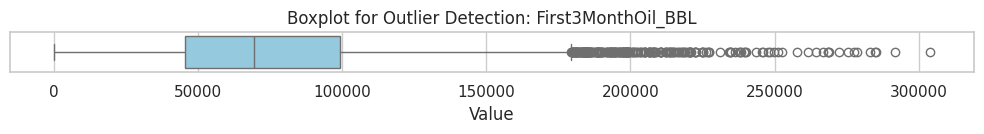

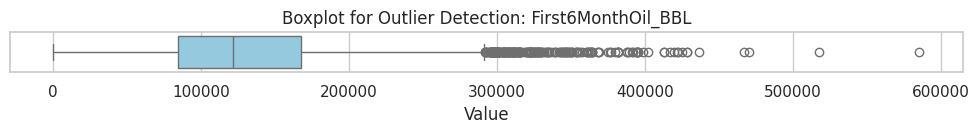

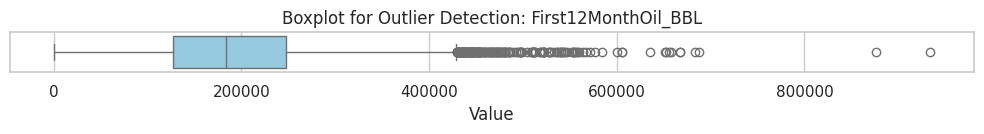

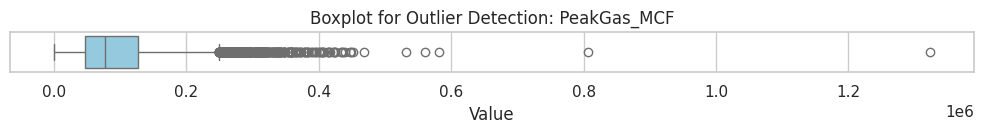

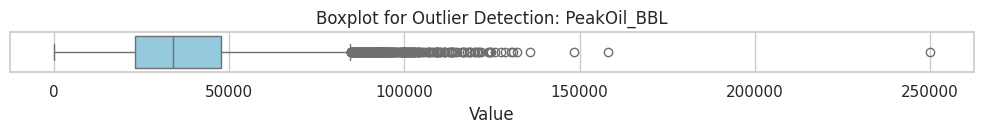

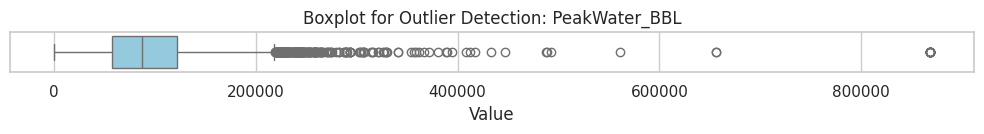

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_outlier_boxplot(df, column):
    """
    Generate a boxplot to visualize outliers for a given column.
    """
    plt.figure(figsize=(10, 1.5))
    sns.boxplot(data=df, x=column, color='skyblue')
    plt.title(f"Boxplot for Outlier Detection: {column}", fontsize=12)
    plt.xlabel("Value")
    plt.tight_layout()
    plt.show()

# 🎯 List of target columns
target_columns = [
    "First3MonthOil_BBL",
    "First6MonthOil_BBL",
    "First12MonthOil_BBL",
    "PeakGas_MCF",
    "PeakOil_BBL",
    "PeakWater_BBL"
]

# 📊 Plot boxplots for each variable
for col in target_columns:
    if col in wells_df.columns:
        plot_outlier_boxplot(wells_df, col)


⏳ Step 11: Time-Based Trend Analysis

If any date columns are available, analyze trends over time

IndexError: index 0 is out of bounds for axis 0 with size 0

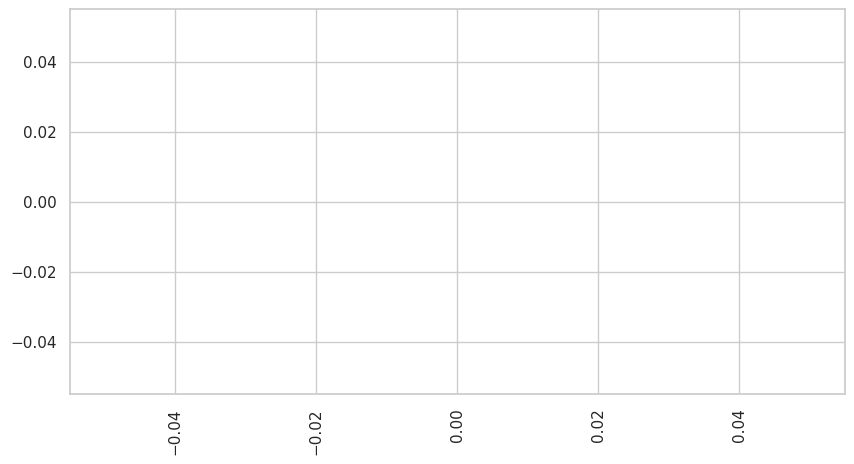

In [ ]:

import matplotlib.dates as mdates

date_cols = [col for col in wells_df.columns if 'Date' in col]
if date_cols:
    wells_df[date_cols[0]] = pd.to_datetime(wells_df[date_cols[0]], errors='coerce')
    wells_df['month'] = wells_df[date_cols[0]].dt.to_period('M')
    plt.figure(figsize=(10, 5))
    wells_df['month'].value_counts().sort_index().plot(kind='bar')
    plt.title(f'Well Counts Over Time by Month ({date_cols[0]})')
    plt.xlabel('Month')
    plt.ylabel('Well Count')
    plt.tight_layout()
    plt.show()

🛢️ Step 12: Production Profile vs. Depth

Example relationship between production and depth

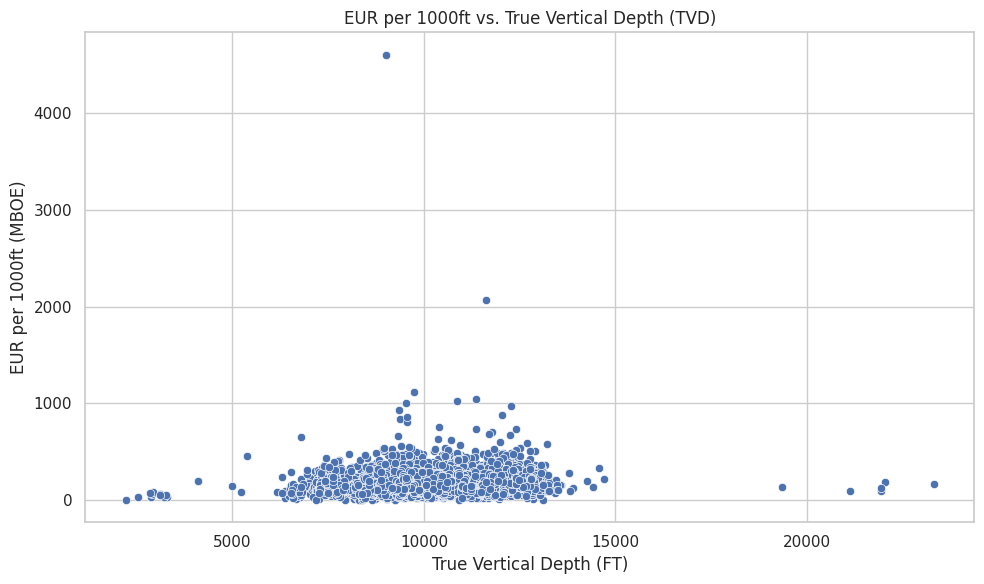

In [ ]:

if 'TVD_FT' in wells_df.columns and 'EURPP_MBOEPer1000FT' in wells_df.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=wells_df, x='TVD_FT', y='EURPP_MBOEPer1000FT')
    plt.title("EUR per 1000ft vs. True Vertical Depth (TVD)")
    plt.xlabel("True Vertical Depth (FT)")
    plt.ylabel("EUR per 1000ft (MBOE)")
    plt.tight_layout()
    plt.show()

📍 Step 13: Compare Production by County

Aggregate average EUR per 1000ft by county (if available)

In [ ]:

if 'CountyName' in wells_df.columns:
    prod_by_county = wells_df.groupby('CountyName')['EURPP_MBOEPer1000FT'].mean().sort_values(ascending=False)
    prod_by_county.plot(kind='bar', figsize=(10, 6), color='coral')
    plt.title("Average EUR per 1000ft by County")
    plt.ylabel("Avg EUR per 1000ft (MBOE)")
    plt.tight_layout()
    plt.show()

🧼 Step 14: Data Cleaning for Modeling

Remove highly missing columns and fill missing values

In [ ]:

threshold = 0.8
wells_cleaned = wells_df.dropna(axis=1, thresh=int((1 - threshold) * len(wells_df)))

for col in wells_cleaned.columns:
    if wells_cleaned[col].dtype in ['float64', 'int64']:
        wells_cleaned[col] = wells_cleaned[col].fillna(wells_cleaned[col].mean())
    else:
        wells_cleaned[col] = wells_cleaned[col].fillna(wells_cleaned[col].mode()[0])

wells_cleaned = wells_cleaned.drop_duplicates()

🎯 Step 15: Feature Selection

Remove low variance and highly correlated features

In [ ]:

from sklearn.feature_selection import VarianceThreshold

selector = VarianceThreshold(threshold=0.01)
X_numeric = wells_cleaned.select_dtypes(include=['float64', 'int64'])
X_var = selector.fit_transform(X_numeric)
selected_features = X_numeric.columns[selector.get_support()]

corr_matrix = X_numeric[selected_features].corr().abs()
upper = corr_matrix.where(~np.tril(np.ones(corr_matrix.shape)).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
X_selected = X_numeric[selected_features].drop(columns=to_drop)

⚙️ Step 16: Feature Engineering

Create new features and one-hot encode categorical columns

In [ ]:

wells_cleaned['LateralLength_FT'] = wells_cleaned['BH_LATITUDE'] - wells_cleaned['SH_LATITUDE']
wells_cleaned['DepthToPerLength'] = wells_cleaned['TVD_FT'] / (wells_cleaned['LateralLength_FT'] + 1)

categoricals = wells_cleaned.select_dtypes(include=['object']).columns
wells_encoded = pd.get_dummies(wells_cleaned, columns=categoricals, drop_first=True)

🤖 Step 17: Train-Test Split and Model Training

Train a simple random forest model and evaluate performance
Define target

In [ ]:

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score

target = 'EURPP_MBOEPer1000FT'
X = wells_encoded.drop(columns=[target])
y = wells_encoded[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

print("MAE:", round(mean_absolute_error(y_test, y_pred), 2))
print("R^2:", round(r2_score(y_test, y_pred), 2))

🔮 Step 18: Forecasting (Optional)

Forecasting production trends using Holt-Winters model (if applicable)

In [ ]:

if 'FirstProdDate' in wells_df.columns:
    wells_df['FirstProdDate'] = pd.to_datetime(wells_df['FirstProdDate'], errors='coerce')
    ts_df = wells_df.groupby('FirstProdDate')['EURPP_MBOEPer1000FT'].mean().dropna().asfreq('MS')

    from statsmodels.tsa.holtwinters import ExponentialSmoothing

    model = ExponentialSmoothing(ts_df, trend='add', seasonal='add', seasonal_periods=12).fit()
    forecast = model.forecast(12)

    ts_df.plot(label='Observed', figsize=(10, 5))
    forecast.plot(label='Forecast', linestyle='--')
    plt.legend()
    plt.title("12-Month Forecast of EUR per 1000ft")
    plt.show()